# Assignment-02: Geospatial EDA on US Road Accidents

In [29]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
import pandas as pd

DATA_PATH = '/content/drive/MyDrive/RoadSafety_Nov25/data/raw/US_Accidents_March23.csv'

USE_SAMPLE = True ## USE THE SAMPLE DATASET NOT THE ENTIRE ONE
SAMPLE_FRAC = 0.1  # 10% sample

df = pd.read_csv(DATA_PATH)

if USE_SAMPLE:
    df = df.sample(frac=SAMPLE_FRAC, random_state=42).reset_index(drop=True)

print(f"Original shape of DataFrame: {df.shape}")

# Check for missing values in 'Start_Lat' and 'Start_Lng'
print("Missing values before dropping:")
print(df[['Start_Lat', 'Start_Lng']].isnull().sum())

# Drop rows with missing values in 'Start_Lat' or 'Start_Lng'
df.dropna(subset=['Start_Lat', 'Start_Lng'], inplace=True)

# Print the new shape of the DataFrame
print(f"Shape of DataFrame after dropping rows with missing coordinates: {df.shape}")

# Display the first 5 rows of the coordinate columns to verify
print("Sample of 'Start_Lat' and 'Start_Lng' after cleaning:")
print(df[['Start_Lat', 'Start_Lng']].head())

Original shape of DataFrame: (772839, 46)
Missing values before dropping:
Start_Lat    0
Start_Lng    0
dtype: int64
Shape of DataFrame after dropping rows with missing coordinates: (772839, 46)
Sample of 'Start_Lat' and 'Start_Lng' after cleaning:
   Start_Lat   Start_Lng
0  26.706900  -80.119360
1  38.781024 -121.265820
2  33.985249  -84.269348
3  47.118706 -122.556908
4  33.451355 -111.890343


## Q1. Spatial Distribution and Hotspots

**Question:**  
**Where are the major spatial hotspots of road accidents in the United States, and how do they differ across states and cities?**

### Tasks

1. Map accident locations using latitude and longitude to visualize overall spatial distribution (e.g., point map, heatmap, or coarse grid density map).  
2. Identify and list the top states and top cities by accident count and compare them using plots or summary tables.  
3. Highlight at least two clear hotspot regions and briefly interpret possible reasons (e.g., urbanization, highways, population density) using the spatial patterns observed.


In [31]:
!pip install folium
!apt-get -qq install -y folium-dev && pip install -U folium
import folium
from folium.plugins import HeatMap

# Approximate center of the contiguous US
us_center_lat = 39.8283
us_center_lng = -98.5795

# Create a base map
m = folium.Map(location=[us_center_lat, us_center_lng], zoom_start=4)

heat_data = df[['Start_Lat', 'Start_Lng']].values.tolist()
HeatMap(heat_data, radius=8, max_zoom=13, min_opacity=0.5).add_to(m)

# Display the map
m

# Install folium if not already installed
!pip install folium

E: Unable to locate package folium-dev


In [32]:
# Top States

state_accident_counts = df['State'].value_counts().reset_index()
state_accident_counts.columns = ['State', 'Accident_Count']

# Sort in descending order and get the top 10
top_10_states = state_accident_counts.sort_values(by='Accident_Count', ascending=False).head(10)

print("Top 10 States by Accident Count:")
print(top_10_states)


Top 10 States by Accident Count:
  State  Accident_Count
0    CA          173589
1    FL           87287
2    TX           58139
3    SC           38511
4    NY           34490
5    NC           34152
6    VA           30534
7    PA           29706
8    MN           19317
9    OR           18113


In [33]:
#Top Cities
import pandas as pd

city_accident_counts = df['City'].value_counts().reset_index()
city_accident_counts.columns = ['City', 'Accident_Count']

top_10_cities = city_accident_counts.sort_values(by='Accident_Count', ascending=False).head(10)

print("Top 10 Cities by Accident Count:")
print(top_10_cities)

Top 10 Cities by Accident Count:
          City  Accident_Count
0        Miami           18525
1      Houston           16937
2  Los Angeles           15628
3    Charlotte           14036
4       Dallas           13146
5      Orlando           10995
6       Austin            9715
7      Raleigh            8622
8    Nashville            7425
9  Baton Rouge            7175


/tmp/ipython-input-2744045786.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='State', y='Accident_Count', data=top_10_states, palette='viridis')


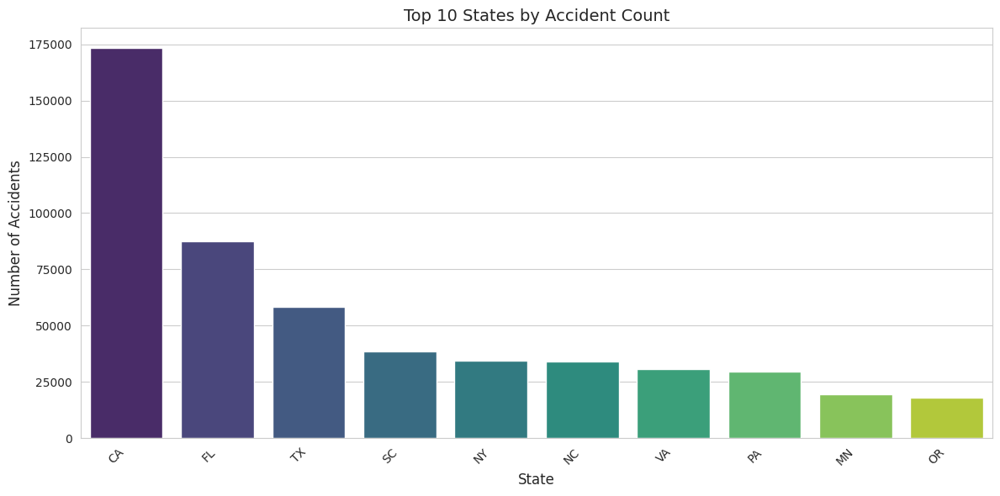

/tmp/ipython-input-2744045786.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='City', y='Accident_Count', data=top_10_cities, palette='magma')


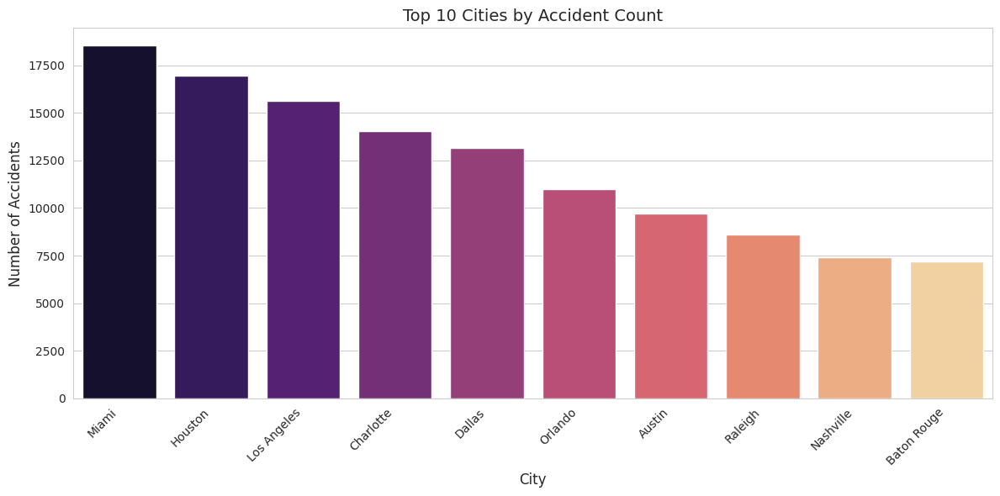

In [34]:
#visualize Top Cities
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# Plot for Top 10 States
plt.figure(figsize=(12, 6))
sns.barplot(x='State', y='Accident_Count', data=top_10_states, palette='viridis')
plt.xlabel('State', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.title('Top 10 States by Accident Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Plot for Top 10 Cities
plt.figure(figsize=(12, 6))
sns.barplot(x='City', y='Accident_Count', data=top_10_cities, palette='magma')
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.title('Top 10 Cities by Accident Count', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


 Q2. Spatial–Temporal Patterns within a State

**Question:**  
**How do accident patterns vary by time of day and month within a specific high-accident state (e.g., CA or TX), and are these patterns spatially concentrated?**

### Tasks

1. Choose one state with a high number of accidents and create hourly and monthly distributions of accidents (bar plots).  
2. Overlay or compare these distributions with maps for selected hours (e.g., peak vs off-peak) or seasons (e.g., winter vs summer) to see whether certain locations within the state become more active at specific times.  
3. Describe any spatial–temporal clusters you observe (e.g., urban cores at rush hour, specific corridors in certain months).


In [35]:
#choosing top state
import pandas as pd

df['Start_Time'] = pd.to_datetime(df['Start_Time'], errors='coerce')

df_ca = df[df['State'] == 'CA'].copy()

print(f"Shape of original DataFrame: {df.shape}")
print(f"Shape of California accidents DataFrame (df_ca): {df_ca.shape}")
print("First 5 rows of 'Start_Time' in original DataFrame after conversion:")
print(df['Start_Time'].head())
print("First 5 rows of 'State' in df_ca:")
print(df_ca['State'].head())

Shape of original DataFrame: (772839, 46)
Shape of California accidents DataFrame (df_ca): (173589, 46)
First 5 rows of 'Start_Time' in original DataFrame after conversion:
0   2020-04-17 09:29:30
1                   NaT
2   2016-08-12 16:45:00
3   2019-09-20 15:22:16
4   2019-06-03 16:55:43
Name: Start_Time, dtype: datetime64[ns]
First 5 rows of 'State' in df_ca:
1     CA
9     CA
12    CA
27    CA
31    CA
Name: State, dtype: object


In [36]:
#hourly distribution of accident
import pandas as pd

df_ca['Hour'] = df_ca['Start_Time'].dt.hour

df_ca['Month'] = df_ca['Start_Time'].dt.month

print("First 5 rows of 'Start_Time', 'Hour', and 'Month' in df_ca after extraction:")
print(df_ca[['Start_Time', 'Hour', 'Month']].head())

First 5 rows of 'Start_Time', 'Hour', and 'Month' in df_ca after extraction:
            Start_Time  Hour  Month
1                  NaT   NaN    NaN
9                  NaT   NaN    NaN
12 2022-04-27 15:47:00  15.0    4.0
27 2018-10-01 04:34:17   4.0   10.0
31 2018-10-30 16:24:01  16.0   10.0


/tmp/ipython-input-1659174069.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_accident_counts.index, y=hourly_accident_counts.values, palette='viridis')


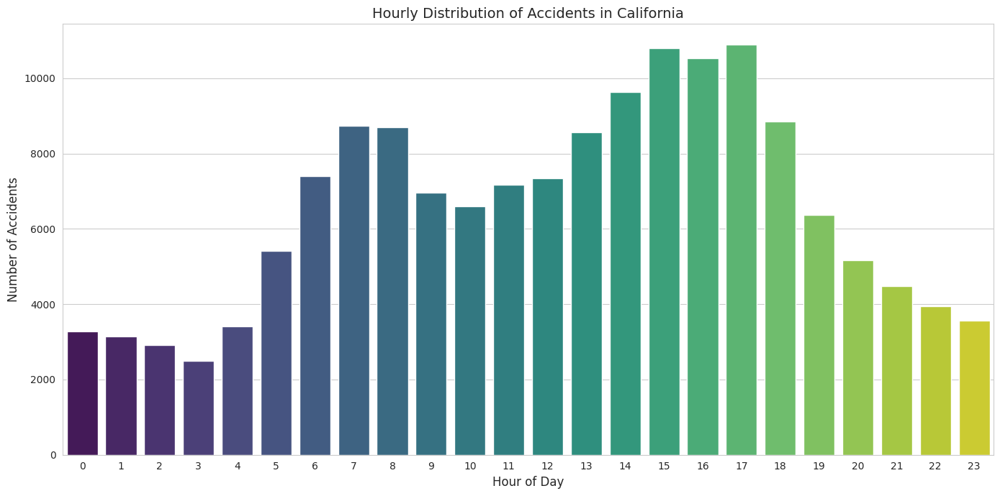

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate accident counts per hour, dropping NaN values
hourly_accident_counts = df_ca['Hour'].dropna().astype(int).value_counts().sort_index()

# Configure plot style
sns.set_style("whitegrid")

# Create the bar plot for hourly accident distribution
plt.figure(figsize=(14, 7))
sns.barplot(x=hourly_accident_counts.index, y=hourly_accident_counts.values, palette='viridis')
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.title('Hourly Distribution of Accidents in California', fontsize=14)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


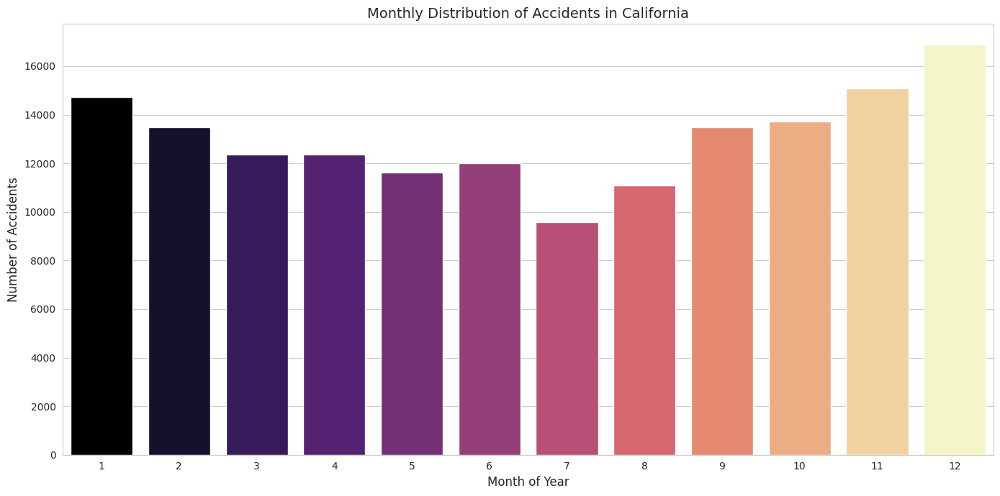

In [38]:
#monthly distribution
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate accident counts per month, dropping NaN values
monthly_accident_counts = df_ca['Month'].dropna().astype(int).value_counts().sort_index()

# Configure plot style
sns.set_style("whitegrid")

# Create the bar plot for monthly accident distribution
plt.figure(figsize=(14, 7))
sns.barplot(x=monthly_accident_counts.index, y=monthly_accident_counts.values, palette='magma', hue=monthly_accident_counts.index, legend=False)
plt.xlabel('Month of Year', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.title('Monthly Distribution of Accidents in California', fontsize=14)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [39]:
#Spatial Distribution using selected hours
import folium
from folium.plugins import HeatMap

peak_hours = [15, 16, 17, 18]
off_peak_hours = [1, 2, 3, 4]

#Filter df_ca for peak hours
df_peak_hours = df_ca[df_ca['Hour'].isin(peak_hours)].copy()

#Filter df_ca for off-peak hours
df_off_peak_hours = df_ca[df_ca['Hour'].isin(off_peak_hours)].copy()

print(f"Number of accidents during peak hours ({peak_hours}): {df_peak_hours.shape[0]}")
print(f"Number of accidents during off-peak hours ({off_peak_hours}): {df_off_peak_hours.shape[0]}")

ca_center_lat = 36.7783
ca_center_lng = -119.4179

m_peak = folium.Map(location=[ca_center_lat, ca_center_lng], zoom_start=6)

heat_data_peak = df_peak_hours[['Start_Lat', 'Start_Lng']].dropna().values.tolist()

if heat_data_peak:
    HeatMap(heat_data_peak, radius=8, max_zoom=13, min_opacity=0.5).add_to(m_peak)
    print("\nPeak Hours Accident Distribution in California:")
    display(m_peak)
else:
    print("\nNo data to display heatmap for peak hours.")

m_off_peak = folium.Map(location=[ca_center_lat, ca_center_lng], zoom_start=6)


heat_data_off_peak = df_off_peak_hours[['Start_Lat', 'Start_Lng']].dropna().values.tolist()

if heat_data_off_peak:
    HeatMap(heat_data_off_peak, radius=8, max_zoom=13, min_opacity=0.5).add_to(m_off_peak)
    print("\nOff-Peak Hours Accident Distribution in California:")
    display(m_off_peak)
else:
    print("\nNo data to display heatmap for off-peak hours.")

Number of accidents during peak hours ([15, 16, 17, 18]): 41077
Number of accidents during off-peak hours ([1, 2, 3, 4]): 11963

Peak Hours Accident Distribution in California:



Off-Peak Hours Accident Distribution in California:


In [40]:
#spatial distribution using selected months
import folium
from folium.plugins import HeatMap


high_accident_months = monthly_accident_counts.nlargest(2).index.tolist()
low_accident_months = monthly_accident_counts.nsmallest(2).index.tolist()

print(f"Months with highest accident counts: {high_accident_months}")
print(f"Months with lowest accident counts: {low_accident_months}")

# Filter df_ca for high-accident months
df_high_months = df_ca[df_ca['Month'].isin(high_accident_months)].copy()

# Filter df_ca for low-accident months
df_low_months = df_ca[df_ca['Month'].isin(low_accident_months)].copy()

print(f"Number of accidents during high accident months ({high_accident_months}): {df_high_months.shape[0]}")
print(f"Number of accidents during low accident months ({low_accident_months}): {df_low_months.shape[0]}")


ca_center_lat = 36.7783
ca_center_lng = -119.4179

m_high_months = folium.Map(location=[ca_center_lat, ca_center_lng], zoom_start=6)


heat_data_high_months = df_high_months[['Start_Lat', 'Start_Lng']].dropna().values.tolist()


if heat_data_high_months:
    HeatMap(heat_data_high_months, radius=8, max_zoom=13, min_opacity=0.5).add_to(m_high_months)
    print("\nHigh Accident Months Distribution in California:")
    display(m_high_months)
else:
    print("\nNo data to display heatmap for high accident months.")


m_low_months = folium.Map(location=[ca_center_lat, ca_center_lng], zoom_start=6)
heat_data_low_months = df_low_months[['Start_Lat', 'Start_Lng']].dropna().values.tolist()

if heat_data_low_months:
    HeatMap(heat_data_low_months, radius=8, max_zoom=13, min_opacity=0.5).add_to(m_low_months)
    print("\nLow Accident Months Distribution in California:")
    display(m_low_months)
else:
    print("\nNo data to display heatmap for low accident months.")

Months with highest accident counts: [12, 11]
Months with lowest accident counts: [7, 8]
Number of accidents during high accident months ([12, 11]): 31961
Number of accidents during low accident months ([7, 8]): 20654

High Accident Months Distribution in California:



Low Accident Months Distribution in California:


## Q3. Geospatial Correlates of Severity

**Question:**  
**How does accident severity vary across space, and what geospatial or contextual factors appear associated with high-severity accidents?**

### Tasks

1. Map accidents colored (or otherwise distinguished) by severity level to see how severe accidents are distributed geographically.  
2. Compare severity distributions across a few selected cities or states, or across urban vs non-urban areas, using plots and maps.  
3. Relate severity to at least one additional spatial/context variable (e.g., weather conditions, presence of junctions/crossings, proximity to highways) and discuss any spatial pattern that emerges.


In [41]:
#preparing data for severity analysis
print(f"Original data type of 'Severity': {df['Severity'].dtype}")

# Assuming Severity values are intended to be integers (1, 2, 3, 4)
if df['Severity'].dtype == 'object':
    df['Severity'] = pd.to_numeric(df['Severity'], errors='coerce')
    print(f"Converted data type of 'Severity': {df['Severity'].dtype}")

# Display unique values and their counts
print("\nDistribution of 'Severity' levels:")
print(df['Severity'].value_counts().sort_index())

Original data type of 'Severity': int64

Distribution of 'Severity' levels:
Severity
1      6803
2    615250
3    130256
4     20530
Name: count, dtype: int64


In [42]:
import folium


us_center_lat = 39.8283
us_center_lng = -98.5795


m_severity = folium.Map(location=[us_center_lat, us_center_lng], zoom_start=4)


severity_colors = {
    1: 'green',
    2: 'blue',
    3: 'orange',
    4: 'red'
}

sample_size = min(10000, df.shape[0]) # Limit sample size to prevent memory issues
sampled_df = df.dropna(subset=['Start_Lat', 'Start_Lng', 'Severity']).sample(n=sample_size, random_state=42).copy()
sampled_df['Severity'] = sampled_df['Severity'].astype(int)

for idx, row in sampled_df.iterrows():
    severity_level = row['Severity']
    color = severity_colors.get(severity_level, 'gray') # Default to gray if severity not found

    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=2, # Small radius for individual points
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip=f"Severity: {severity_level}"
    ).add_to(m_severity)

# Display the map
m_severity

In [43]:
#Compare Severity Distributions Across States
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get the list of top states from the 'top_10_states' DataFrame
top_states_list = top_10_states['State'].tolist()

# Filter the main DataFrame to include only accidents from these top states
df_top_states = df[df['State'].isin(top_states_list)].copy()

# Group by 'State' and 'Severity' and count occurrences
severity_by_state = df_top_states.groupby(['State', 'Severity']).size().unstack(fill_value=0)

# Calculate the proportion of each severity level within each state
severity_proportions = severity_by_state.div(severity_by_state.sum(axis=1), axis=0)

print("Severity counts by state and level:")
print(severity_by_state.head())
print("\nSeverity proportions by state and level:")
print(severity_proportions.head())

Severity counts by state and level:
Severity     1       2      3     4
State                              
CA        1060  143801  27393  1335
FL         718   75014  10269  1286
MN          42   16142   3052    81
NC         521   29573   3002  1056
NY         115   26309   6974  1092

Severity proportions by state and level:
Severity         1         2         3         4
State                                           
CA        0.006106  0.828399  0.157804  0.007691
FL        0.008226  0.859395  0.117646  0.014733
MN        0.002174  0.835637  0.157996  0.004193
NC        0.015255  0.865923  0.087901  0.030921
NY        0.003334  0.762801  0.202204  0.031661


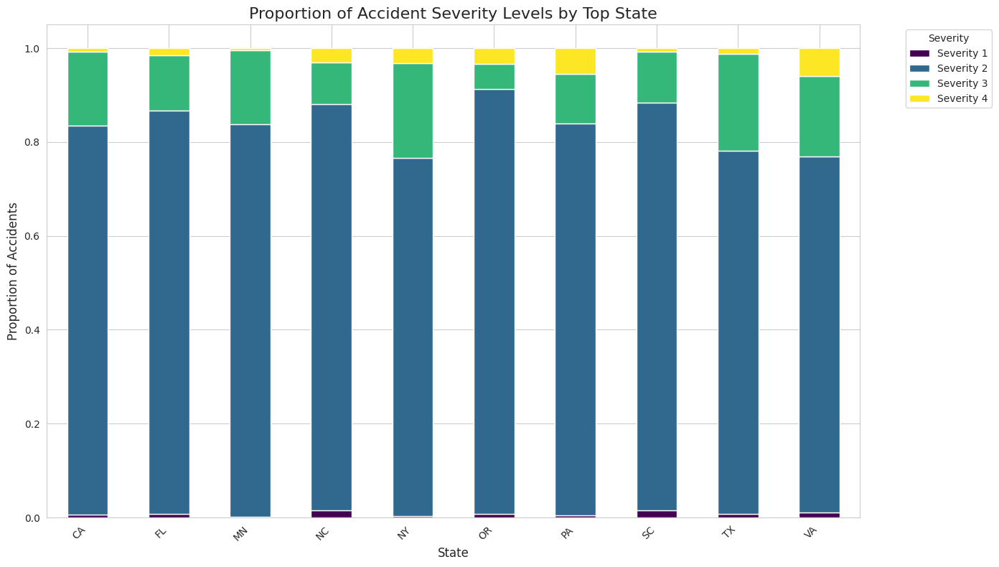

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# Plotting the stacked bar chart
ax = severity_proportions.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Proportion of Accident Severity Levels by Top State', fontsize=16)
plt.xlabel('State', fontsize=12)
plt.ylabel('Proportion of Accidents', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Customize legend
handles, labels = ax.get_legend_handles_labels()
# Map severity numbers to more descriptive labels if desired, or keep as is
severity_labels = {1: 'Severity 1', 2: 'Severity 2', 3: 'Severity 3', 4: 'Severity 4'}
new_labels = [severity_labels.get(int(label), label) for label in labels]
plt.legend(handles, new_labels, title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [45]:
#Compare Severity Distributions Across Cities
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Get the list of top cities from the 'top_10_cities' DataFrame
top_cities_list = top_10_cities['City'].tolist()

# Filter the main DataFrame to include only accidents from these top cities
df_top_cities = df[df['City'].isin(top_cities_list)].copy()

# Group by 'City' and 'Severity' and count occurrences
severity_by_city = df_top_cities.groupby(['City', 'Severity']).size().unstack(fill_value=0)

# Calculate the proportion of each severity level within each city
severity_proportions_city = severity_by_city.div(severity_by_city.sum(axis=1), axis=0)

print("Severity counts by city and level:")
print(severity_by_city.head())
print("\nSeverity proportions by city and level:")
print(severity_proportions_city.head())

Severity counts by city and level:
Severity       1      2     3    4
City                              
Austin        57   8798   830   30
Baton Rouge  104   6400   644   27
Charlotte    282  12954   732   68
Dallas       136   9523  3354  133
Houston       67  13835  2928  107

Severity proportions by city and level:
Severity            1         2         3         4
City                                               
Austin       0.005867  0.905610  0.085435  0.003088
Baton Rouge  0.014495  0.891986  0.089756  0.003763
Charlotte    0.020091  0.922913  0.052152  0.004845
Dallas       0.010345  0.724403  0.255135  0.010117
Houston      0.003956  0.816851  0.172876  0.006318


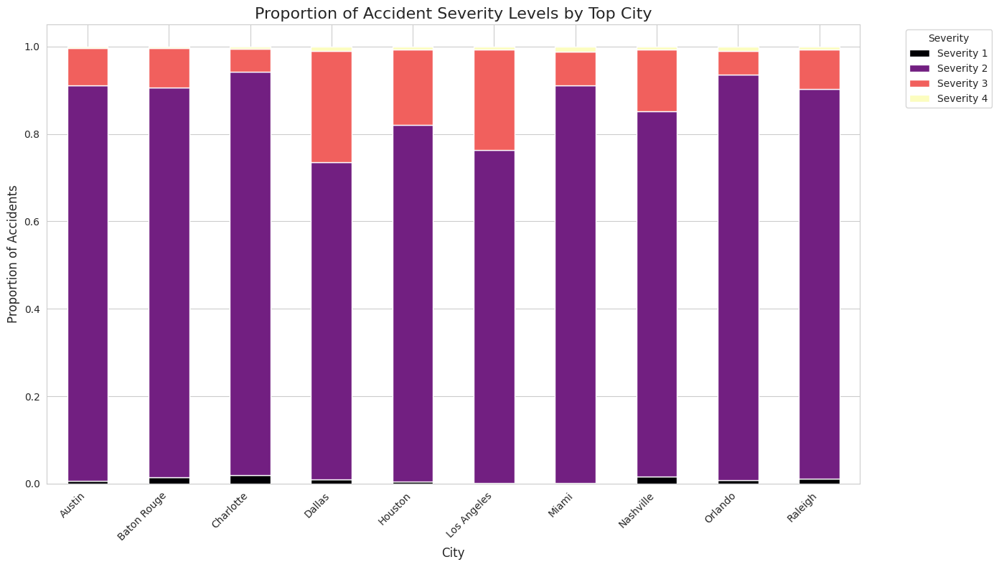

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# Plotting the stacked bar chart for cities
ax_city = severity_proportions_city.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='magma')
plt.title('Proportion of Accident Severity Levels by Top City', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Proportion of Accidents', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Customize legend
handles_city, labels_city = ax_city.get_legend_handles_labels()
# Map severity numbers to more descriptive labels
severity_labels = {1: 'Severity 1', 2: 'Severity 2', 3: 'Severity 3', 4: 'Severity 4'}
new_labels_city = [severity_labels.get(int(label), label) for label in labels_city]
plt.legend(handles_city, new_labels_city, title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [47]:
#Compare Severity by Urban vs. Non-Urban Areas
import numpy as np

# Create 'Area_Type' column based on 'City' column
df['Area_Type'] = np.where(df['City'].notna(), 'Urban', 'Non-Urban')

print("Distribution of 'Area_Type':")
print(df['Area_Type'].value_counts())
print("First 5 rows with 'City' and 'Area_Type' for verification:")
print(df[['City', 'Area_Type']].head())

Distribution of 'Area_Type':
Area_Type
Urban        772811
Non-Urban        28
Name: count, dtype: int64
First 5 rows with 'City' and 'Area_Type' for verification:
              City Area_Type
0  West Palm Beach     Urban
1        Roseville     Urban
2       Alpharetta     Urban
3           Tacoma     Urban
4       Scottsdale     Urban


In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group by 'Area_Type' and 'Severity' and count occurrences
severity_by_area_type = df.groupby(['Area_Type', 'Severity']).size().unstack(fill_value=0)

# Calculate the proportion of each severity level within each area type
severity_proportions_area = severity_by_area_type.div(severity_by_area_type.sum(axis=1), axis=0)

print("Severity counts by area type and level:")
print(severity_by_area_type)
print("\nSeverity proportions by area type and level:")
print(severity_proportions_area)

Severity counts by area type and level:
Severity      1       2       3      4
Area_Type                             
Non-Urban     0      24       2      2
Urban      6803  615226  130254  20528

Severity proportions by area type and level:
Severity          1         2         3         4
Area_Type                                        
Non-Urban  0.000000  0.857143  0.071429  0.071429
Urban      0.008803  0.796089  0.168546  0.026563


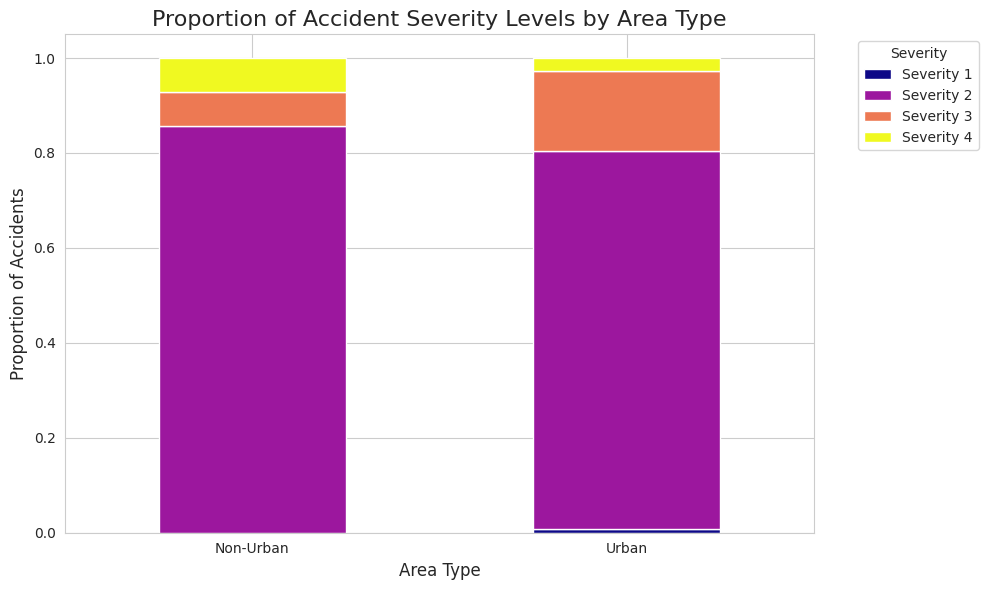

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

# Plotting the stacked bar chart for urban vs. non-urban areas
ax_area = severity_proportions_area.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='plasma')
plt.title('Proportion of Accident Severity Levels by Area Type', fontsize=16)
plt.xlabel('Area Type', fontsize=12)
plt.ylabel('Proportion of Accidents', fontsize=12)
plt.xticks(rotation=0)

# Customize legend
handles_area, labels_area = ax_area.get_legend_handles_labels()
# Map severity numbers to more descriptive labels
severity_labels = {1: 'Severity 1', 2: 'Severity 2', 3: 'Severity 3', 4: 'Severity 4'}
new_labels_area = [severity_labels.get(int(label), label) for label in labels_area]
plt.legend(handles_area, new_labels_area, title='Severity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [50]:
print("Unique values and their counts for 'Junction' column:")
print(df['Junction'].value_counts(dropna=False))

Unique values and their counts for 'Junction' column:
Junction
False    716129
True      56710
Name: count, dtype: int64


In [51]:
mean_severity_junction_true = df[df['Junction'] == True]['Severity'].mean()
mean_severity_junction_false = df[df['Junction'] == False]['Severity'].mean()

print(f"Mean Severity for accidents at a Junction (Junction=True): {mean_severity_junction_true:.3f}")
print(f"Mean Severity for accidents not at a Junction (Junction=False): {mean_severity_junction_false:.3f}")

Mean Severity for accidents at a Junction (Junction=True): 2.296
Mean Severity for accidents not at a Junction (Junction=False): 2.206


/tmp/ipython-input-943785789.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Junction Type', y='Mean Severity', data=severity_data, palette='coolwarm')


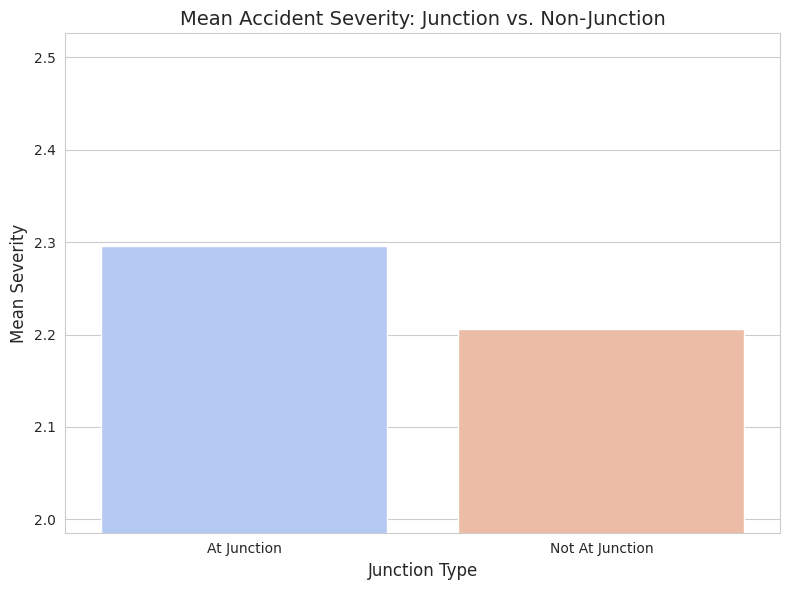

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame for plotting
severity_data = pd.DataFrame({
    'Junction Type': ['At Junction', 'Not At Junction'],
    'Mean Severity': [mean_severity_junction_true, mean_severity_junction_false]
})

# Configure plot style
sns.set_style("whitegrid")

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='Junction Type', y='Mean Severity', data=severity_data, palette='coolwarm')
plt.title('Mean Accident Severity: Junction vs. Non-Junction', fontsize=14)
plt.xlabel('Junction Type', fontsize=12)
plt.ylabel('Mean Severity', fontsize=12)
plt.ylim(severity_data['Mean Severity'].min() * 0.9, severity_data['Mean Severity'].max() * 1.1) # Adjust y-axis limits for better visualization
plt.tight_layout()
plt.show()

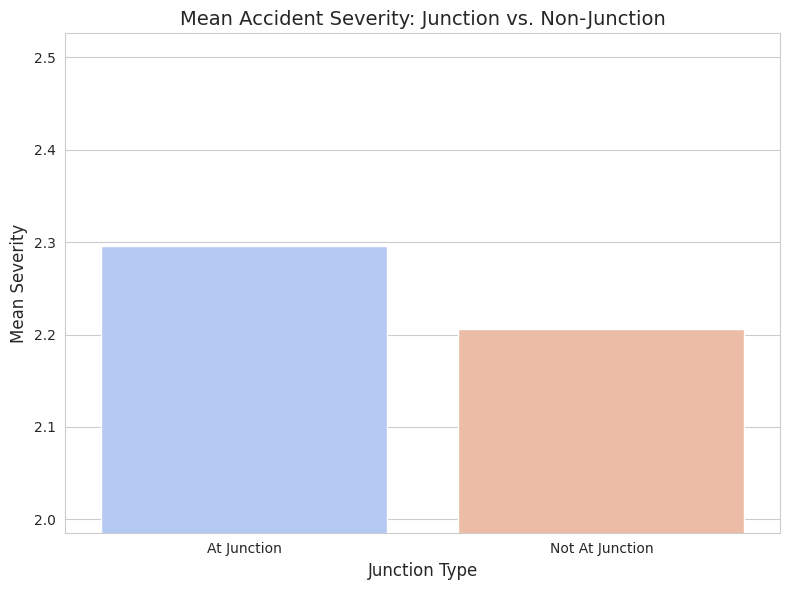

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame for plotting
severity_data = pd.DataFrame({
    'Junction Type': ['At Junction', 'Not At Junction'],
    'Mean Severity': [mean_severity_junction_true, mean_severity_junction_false]
})

# Configure plot style
sns.set_style("whitegrid")

# Create the bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x='Junction Type', y='Mean Severity', data=severity_data, palette='coolwarm', hue='Junction Type', legend=False)
plt.title('Mean Accident Severity: Junction vs. Non-Junction', fontsize=14)
plt.xlabel('Junction Type', fontsize=12)
plt.ylabel('Mean Severity', fontsize=12)
plt.ylim(severity_data['Mean Severity'].min() * 0.9, severity_data['Mean Severity'].max() * 1.1) # Adjust y-axis limits for better visualization
plt.tight_layout()
plt.show()